In [1]:
import numpy as np 
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import statsmodels.api as sm
import folium 
from folium.plugins import FastMarkerCluster
from sklearn.preprocessing import LabelEncoder
import ast

In [2]:
from sklearn.feature_selection import mutual_info_regression
from folium.plugins import FastMarkerCluster
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import StackingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import Ridge
from sklearn import linear_model
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import VarianceThreshold
from sklearn import preprocessing
from sklearn.linear_model import Lasso
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score



In [84]:
train_df = pd.read_csv('Train.csv')
test_df = pd.read_csv('Test.csv')
extradata_df = pd.read_csv('extra_data.csv')

In [85]:
train_df.head()


,MERCHANT_CATEGORIZED_AT,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,PURCHASED_AT,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,USER_ID,Transaction_ID
0,2022-05-04 10:25:50.588042+00,UONSDA CHURCH MOGERE MWAYO TITHE,Rent / Mortgage,1700,2022-05-04 13:56:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_04mk78fa
1,2021-10-25 16:18:38.586837+00,PARK N GO,Transport & Fuel,100,2021-10-24 14:12:00+00,False,25.0,Female,4,90000,ID_U9WZMGJZ,ID_04xkfb07
2,2022-05-20 14:17:30.917297+00,SAFARICOM OFFERS TUNUKIWA,Data & WiFi,20,2022-05-27 12:46:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_051urwuw
3,2022-04-12 15:59:14.139347+00,ZILLIONS CREDIT LIMITED,Loan Repayment,3800,2022-02-07 12:16:00+00,False,NaN,Male,5,252000,ID_3JA0MAFB,ID_0e1om7rz
4,2022-05-04 10:24:26.709045+00,MICHAEL MUSEMBI,Bills & Fees,60,2022-05-04 15:28:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0kfcoawb


In [86]:
train_df.shape

(373, 12)

In [87]:
train_df.dtypes

MERCHANT_CATEGORIZED_AT                   object
MERCHANT_NAME                             object
MERCHANT_CATEGORIZED_AS                   object
PURCHASE_VALUE                             int64
PURCHASED_AT                              object
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY       bool
USER_AGE                                 float64
USER_GENDER                               object
USER_HOUSEHOLD                             int64
USER_INCOME                                int64
USER_ID                                   object
Transaction_ID                            object
dtype: object

In [88]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 373 entries, 0 to 372
Data columns (total 12 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   MERCHANT_CATEGORIZED_AT                373 non-null    object 
 1   MERCHANT_NAME                          373 non-null    object 
 2   MERCHANT_CATEGORIZED_AS                373 non-null    object 
 3   PURCHASE_VALUE                         373 non-null    int64  
 4   PURCHASED_AT                           373 non-null    object 
 5   IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY  373 non-null    bool   
 6   USER_AGE                               61 non-null     float64
 7   USER_GENDER                            367 non-null    object 
 8   USER_HOUSEHOLD                         373 non-null    int64  
 9   USER_INCOME                            373 non-null    int64  
 10  USER_ID                                373 non-null    object 
 11  Transa

In [89]:
test_df.head()

,MERCHANT_CATEGORIZED_AT,MERCHANT_NAME,PURCHASE_VALUE,PURCHASED_AT,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,USER_ID,Transaction_ID
0,2022-06-01 10:25:16.7131+00,KCB PAYBILL AC,150000,2022-05-05 08:29:00+00,True,NaN,Male,5,150000,ID_O8P8YS18,ID_00x9h2yx
1,2022-03-16 13:05:51.851102+00,IPAY LTD,7394,2019-10-05 16:02:00+00,False,NaN,Female,1,10000,ID_40L9OTIM,ID_01db594f
2,2022-03-10 18:25:42.112294+00,JOHN NJIRU GAKUNJU,200,2021-11-25 09:56:00+00,False,NaN,Female,1,85000,ID_1I8XYBWK,ID_07pm99no
3,2022-04-12 15:59:14.139347+00,UONSDA CHURCH OFFERING-MAIN,50,2022-04-11 14:48:00+00,False,NaN,Male,2,10000,ID_GR569FUO,ID_09jryhkd
4,2022-05-04 10:24:26.709045+00,M-SHWARI LOCK SAVINGS,10000,2022-05-04 13:59:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0ccv924c


In [90]:
test_df.shape

(558, 11)

In [91]:
test_df.dtypes

MERCHANT_CATEGORIZED_AT                   object
MERCHANT_NAME                             object
PURCHASE_VALUE                             int64
PURCHASED_AT                              object
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY       bool
USER_AGE                                 float64
USER_GENDER                               object
USER_HOUSEHOLD                             int64
USER_INCOME                                int64
USER_ID                                   object
Transaction_ID                            object
dtype: object

In [92]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 558 entries, 0 to 557
Data columns (total 11 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   MERCHANT_CATEGORIZED_AT                558 non-null    object 
 1   MERCHANT_NAME                          558 non-null    object 
 2   PURCHASE_VALUE                         558 non-null    int64  
 3   PURCHASED_AT                           558 non-null    object 
 4   IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY  558 non-null    bool   
 5   USER_AGE                               85 non-null     float64
 6   USER_GENDER                            553 non-null    object 
 7   USER_HOUSEHOLD                         558 non-null    int64  
 8   USER_INCOME                            558 non-null    int64  
 9   USER_ID                                558 non-null    object 
 10  Transaction_ID                         558 non-null    object 
dtypes: boo

In [93]:
extradata_df.head()

,MERCHANT_CATEGORIZED_AT,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,PURCHASED_AT,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,USER_ID,Transaction_ID
0,NaN,MARK NYABAYO,NaN,20,2021-03-22 12:37:00+00,False,NaN,NaN,1,10000,ID_R4T8Q46J,ID_v13grrw3
1,NaN,ACCESS AFYA,NaN,1,2021-07-05 11:07:00+00,False,NaN,NaN,1,10000,ID_R4T8Q46J,ID_rgne8ij5
2,NaN,POA,NaN,1500,2021-06-21 19:40:00+00,False,NaN,NaN,1,10000,ID_R4T8Q46J,ID_4i2b28b6
3,NaN,POA,NaN,1500,2021-04-22 18:41:00+00,False,NaN,NaN,1,10000,ID_R4T8Q46J,ID_6dvi32yc
4,NaN,ACCESS AFYA,NaN,1,2021-07-29 13:03:00+00,False,NaN,NaN,1,10000,ID_R4T8Q46J,ID_sfk1yxbm


In [94]:
extradata_df.shape

(10000, 12)

In [95]:
extradata_df.dtypes

MERCHANT_CATEGORIZED_AT                  float64
MERCHANT_NAME                             object
MERCHANT_CATEGORIZED_AS                  float64
PURCHASE_VALUE                             int64
PURCHASED_AT                              object
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY       bool
USER_AGE                                 float64
USER_GENDER                               object
USER_HOUSEHOLD                             int64
USER_INCOME                                int64
USER_ID                                   object
Transaction_ID                            object
dtype: object

In [96]:
conc_df = pd.concat([train_df,extradata_df], axis=0)
conc_df

,MERCHANT_CATEGORIZED_AT,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,PURCHASED_AT,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,USER_ID,Transaction_ID
0,2022-05-04 10:25:50.588042+00,UONSDA CHURCH MOGERE MWAYO TITHE,Rent / Mortgage,1700,2022-05-04 13:56:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_04mk78fa
1,2021-10-25 16:18:38.586837+00,PARK N GO,Transport & Fuel,100,2021-10-24 14:12:00+00,False,25.0,Female,4,90000,ID_U9WZMGJZ,ID_04xkfb07
2,2022-05-20 14:17:30.917297+00,SAFARICOM OFFERS TUNUKIWA,Data & WiFi,20,2022-05-27 12:46:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_051urwuw
3,2022-04-12 15:59:14.139347+00,ZILLIONS CREDIT LIMITED,Loan Repayment,3800,2022-02-07 12:16:00+00,False,NaN,Male,5,252000,ID_3JA0MAFB,ID_0e1om7rz
4,2022-05-04 10:24:26.709045+00,MICHAEL MUSEMBI,Bills & Fees,60,2022-05-04 15:28:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0kfcoawb
5,2022-01-07 09:41:44.286084+00,JOSEPH NTHENGE,Miscellaneous,14800,2022-01-08 12:56:00+00,True,27.0,Female,2,8000,ID_L8QMYB09,ID_0ntvo3wr
6,2021-10-05 12:45:58.000193+00,NAIVAS KITENGELA,Groceries,657,2021-10-06 17:11:00+00,False,25.0,Female,4,90000,ID_U9WZMGJZ,ID_0vakiykh
7,2022-05-13 06:55:53.403538+00,FATUMA OSORE,Bills & Fees,100,2022-05-13 14:04:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0vhidyto
8,2022-05-31 13:27:24.704992+00,FARMERS BUTCHERY,Shopping,1600,2022-02-19 10:34:00+00,False,NaN,Male,5,150000,ID_O8P8YS18,ID_0wnir1ur
9,2022-06-01 10:25:16.7131+00,M-SHWARI ACCOUNT,Bills & Fees,1000,2022-06-02 06:42:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0xrs122b


In [97]:
conc_df.nunique()

MERCHANT_CATEGORIZED_AT                     58
MERCHANT_NAME                             2908
MERCHANT_CATEGORIZED_AS                     13
PURCHASE_VALUE                            1571
PURCHASED_AT                             10259
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY        2
USER_AGE                                     6
USER_GENDER                                  2
USER_HOUSEHOLD                               9
USER_INCOME                                 21
USER_ID                                     40
Transaction_ID                           10373
dtype: int64

In [98]:
conc_df.nunique()
    

MERCHANT_CATEGORIZED_AT                     58
MERCHANT_NAME                             2908
MERCHANT_CATEGORIZED_AS                     13
PURCHASE_VALUE                            1571
PURCHASED_AT                             10259
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY        2
USER_AGE                                     6
USER_GENDER                                  2
USER_HOUSEHOLD                               9
USER_INCOME                                 21
USER_ID                                     40
Transaction_ID                           10373
dtype: int64

In [18]:
missing_perc = conc_df.isna().sum()
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
missing_perc

MERCHANT_CATEGORIZED_AT                  10000
MERCHANT_NAME                                0
MERCHANT_CATEGORIZED_AS                  10000
PURCHASE_VALUE                               0
PURCHASED_AT                                 0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY        0
USER_AGE                                  9154
USER_GENDER                                 40
USER_HOUSEHOLD                               0
USER_INCOME                                  0
USER_ID                                      0
Transaction_ID                               0
dtype: int64

In [ ]:

conc_df = test_df.drop(['USER_ID', 'Transaction_ID'], axis=1)
conc_df



In [ ]:

conc_df = conc_df.drop(['USER_ID', 'Transaction_ID'], axis=1)
conc_df

In [21]:
conc_df.columns

Index(['MERCHANT_CATEGORIZED_AT', 'MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS',
       'PURCHASE_VALUE', 'PURCHASED_AT',
       'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
       'USER_HOUSEHOLD', 'USER_INCOME'],
      dtype='object')

In [22]:
missing_perc = conc_df.isna().sum()/conc_df.shape[0]*100
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
missing_perc

MERCHANT_CATEGORIZED_AT                  96.404126
MERCHANT_NAME                             0.000000
MERCHANT_CATEGORIZED_AS                  96.404126
PURCHASE_VALUE                            0.000000
PURCHASED_AT                              0.000000
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY     0.000000
USER_AGE                                 88.248337
USER_GENDER                               0.385617
USER_HOUSEHOLD                            0.000000
USER_INCOME                               0.000000
dtype: float64

In [83]:
missing_perc = test_df.isna().sum()/test_df.shape[0]*100
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
missing_perc

MERCHANT_NAME                            0.0
PURCHASE_VALUE                           0.0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY    0.0
USER_AGE                                 0.0
USER_GENDER                              0.0
USER_HOUSEHOLD                           0.0
USER_INCOME                              0.0
USER_ID                                  0.0
Transaction_ID                           0.0
Day_MERCHANT                             0.0
Month_MERCHANT                           0.0
Year_MERCHANT                            0.0
Hour_MERCHANT                            0.0
Day_PURCHASED                            0.0
Month_PURCHASED                          0.0
Year_PURCHASED                           0.0
Hour_PURCHASED                           0.0
dtype: float64

In [23]:

conc_df['USER_GENDER'].fillna(conc_df['USER_GENDER'].mode()[0], inplace=True)

test_df['USER_GENDER'].fillna(test_df['USER_GENDER'].mode()[0], inplace=True)


In [24]:

conc_df['MERCHANT_CATEGORIZED_AT'] = pd.to_datetime(conc_df['MERCHANT_CATEGORIZED_AT'])

In [25]:

conc_df['Day_MERCHANT'] = conc_df['MERCHANT_CATEGORIZED_AT'].dt.day
conc_df['Month_MERCHANT'] = conc_df['MERCHANT_CATEGORIZED_AT'].dt.month_name()
conc_df['Year_MERCHANT'] = conc_df['MERCHANT_CATEGORIZED_AT'].dt.year
conc_df['Hour_MERCHANT'] = conc_df['MERCHANT_CATEGORIZED_AT'].dt.hour


conc_df = conc_df.drop(['MERCHANT_CATEGORIZED_AT'], axis=1)




In [26]:
conc_df.head()

,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,PURCHASED_AT,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,Day_MERCHANT,Month_MERCHANT,Year_MERCHANT,Hour_MERCHANT
0,UONSDA CHURCH MOGERE MWAYO TITHE,Rent / Mortgage,1700,2022-05-04 13:56:00+00,False,NaN,Male,3,10000,4.0,May,2022.0,10.0
1,PARK N GO,Transport & Fuel,100,2021-10-24 14:12:00+00,False,25.0,Female,4,90000,25.0,October,2021.0,16.0
2,SAFARICOM OFFERS TUNUKIWA,Data & WiFi,20,2022-05-27 12:46:00+00,False,NaN,Male,3,10000,20.0,May,2022.0,14.0
3,ZILLIONS CREDIT LIMITED,Loan Repayment,3800,2022-02-07 12:16:00+00,False,NaN,Male,5,252000,12.0,April,2022.0,15.0
4,MICHAEL MUSEMBI,Bills & Fees,60,2022-05-04 15:28:00+00,False,NaN,Male,3,10000,4.0,May,2022.0,10.0


In [27]:
test_df['MERCHANT_CATEGORIZED_AT'] = pd.to_datetime(test_df['MERCHANT_CATEGORIZED_AT'])

In [28]:
test_df['Day_MERCHANT'] = pd.to_datetime(test_df['MERCHANT_CATEGORIZED_AT']).dt.day
test_df['Month_MERCHANT'] = test_df['MERCHANT_CATEGORIZED_AT'].dt.month_name()
test_df['Year_MERCHANT'] = test_df['MERCHANT_CATEGORIZED_AT'].dt.year
test_df['Hour_MERCHANT'] = test_df['MERCHANT_CATEGORIZED_AT'].dt.hour

test_df = test_df.drop(['MERCHANT_CATEGORIZED_AT'], axis=1)
test_df.head()

,MERCHANT_NAME,PURCHASE_VALUE,PURCHASED_AT,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,USER_ID,Transaction_ID,Day_MERCHANT,Month_MERCHANT,Year_MERCHANT,Hour_MERCHANT
0,KCB PAYBILL AC,150000,2022-05-05 08:29:00+00,True,NaN,Male,5,150000,ID_O8P8YS18,ID_00x9h2yx,1,June,2022,10
1,IPAY LTD,7394,2019-10-05 16:02:00+00,False,NaN,Female,1,10000,ID_40L9OTIM,ID_01db594f,16,March,2022,13
2,JOHN NJIRU GAKUNJU,200,2021-11-25 09:56:00+00,False,NaN,Female,1,85000,ID_1I8XYBWK,ID_07pm99no,10,March,2022,18
3,UONSDA CHURCH OFFERING-MAIN,50,2022-04-11 14:48:00+00,False,NaN,Male,2,10000,ID_GR569FUO,ID_09jryhkd,12,April,2022,15
4,M-SHWARI LOCK SAVINGS,10000,2022-05-04 13:59:00+00,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0ccv924c,4,May,2022,10


In [29]:
conc_df['PURCHASED_AT'] = pd.to_datetime(conc_df['PURCHASED_AT'])

In [30]:
conc_df['Day_PURCHASED'] = pd.to_datetime(conc_df['PURCHASED_AT']).dt.day
conc_df['Month_PURCHASED'] = conc_df['PURCHASED_AT'].dt.month_name()
conc_df['Year_PURCHASED'] = conc_df['PURCHASED_AT'].dt.year
conc_df['Hour_PURCHASED'] = conc_df['PURCHASED_AT'].dt.hour


conc_df = conc_df.drop(['PURCHASED_AT'], axis=1)
conc_df.head()

,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,Day_MERCHANT,Month_MERCHANT,Year_MERCHANT,Hour_MERCHANT,Day_PURCHASED,Month_PURCHASED,Year_PURCHASED,Hour_PURCHASED
0,UONSDA CHURCH MOGERE MWAYO TITHE,Rent / Mortgage,1700,False,NaN,Male,3,10000,4.0,May,2022.0,10.0,4,May,2022,13
1,PARK N GO,Transport & Fuel,100,False,25.0,Female,4,90000,25.0,October,2021.0,16.0,24,October,2021,14
2,SAFARICOM OFFERS TUNUKIWA,Data & WiFi,20,False,NaN,Male,3,10000,20.0,May,2022.0,14.0,27,May,2022,12
3,ZILLIONS CREDIT LIMITED,Loan Repayment,3800,False,NaN,Male,5,252000,12.0,April,2022.0,15.0,7,February,2022,12
4,MICHAEL MUSEMBI,Bills & Fees,60,False,NaN,Male,3,10000,4.0,May,2022.0,10.0,4,May,2022,15


In [31]:
test_df['PURCHASED_AT'] = pd.to_datetime(test_df['PURCHASED_AT'])

In [32]:

test_df['Day_PURCHASED'] = pd.to_datetime(test_df['PURCHASED_AT']).dt.day
test_df['Month_PURCHASED'] = test_df['PURCHASED_AT'].dt.month_name()
test_df['Year_PURCHASED'] = test_df['PURCHASED_AT'].dt.year
test_df['Hour_PURCHASED'] = test_df['PURCHASED_AT'].dt.hour

test_df = test_df.drop(['PURCHASED_AT'], axis=1)
test_df.head()

,MERCHANT_NAME,PURCHASE_VALUE,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,USER_ID,Transaction_ID,Day_MERCHANT,Month_MERCHANT,Year_MERCHANT,Hour_MERCHANT,Day_PURCHASED,Month_PURCHASED,Year_PURCHASED,Hour_PURCHASED
0,KCB PAYBILL AC,150000,True,NaN,Male,5,150000,ID_O8P8YS18,ID_00x9h2yx,1,June,2022,10,5,May,2022,8
1,IPAY LTD,7394,False,NaN,Female,1,10000,ID_40L9OTIM,ID_01db594f,16,March,2022,13,5,October,2019,16
2,JOHN NJIRU GAKUNJU,200,False,NaN,Female,1,85000,ID_1I8XYBWK,ID_07pm99no,10,March,2022,18,25,November,2021,9
3,UONSDA CHURCH OFFERING-MAIN,50,False,NaN,Male,2,10000,ID_GR569FUO,ID_09jryhkd,12,April,2022,15,11,April,2022,14
4,M-SHWARI LOCK SAVINGS,10000,False,NaN,Male,3,10000,ID_ZX4DCF4K,ID_0ccv924c,4,May,2022,10,4,May,2022,13


In [33]:
conc_df['MERCHANT_CATEGORIZED_AS'].fillna(conc_df['MERCHANT_CATEGORIZED_AS'].mode()[0], inplace=True)

In [34]:
conc_df['USER_AGE'].fillna(conc_df['USER_AGE'].mode()[0], inplace=True)


In [35]:
test_df['USER_AGE'].fillna(test_df['USER_AGE'].mode()[0], inplace=True)


In [36]:
conc_df['Day_MERCHANT'].fillna(conc_df['Day_MERCHANT'].mean(),inplace=True)

In [37]:

month_dict = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
    'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12
}
conc_df['Month_MERCHANT'] = conc_df['Month_MERCHANT'].map(month_dict)


median_value = conc_df['Month_MERCHANT'].median()
conc_df['Month_MERCHANT'].fillna(median_value, inplace=True)


In [38]:
conc_df.head()

,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,Day_MERCHANT,Month_MERCHANT,Year_MERCHANT,Hour_MERCHANT,Day_PURCHASED,Month_PURCHASED,Year_PURCHASED,Hour_PURCHASED
0,UONSDA CHURCH MOGERE MWAYO TITHE,Rent / Mortgage,1700,False,25.0,Male,3,10000,4.0,5.0,2022.0,10.0,4,May,2022,13
1,PARK N GO,Transport & Fuel,100,False,25.0,Female,4,90000,25.0,10.0,2021.0,16.0,24,October,2021,14
2,SAFARICOM OFFERS TUNUKIWA,Data & WiFi,20,False,25.0,Male,3,10000,20.0,5.0,2022.0,14.0,27,May,2022,12
3,ZILLIONS CREDIT LIMITED,Loan Repayment,3800,False,25.0,Male,5,252000,12.0,4.0,2022.0,15.0,7,February,2022,12
4,MICHAEL MUSEMBI,Bills & Fees,60,False,25.0,Male,3,10000,4.0,5.0,2022.0,10.0,4,May,2022,15


In [39]:
conc_df['Year_MERCHANT'].fillna(conc_df['Year_MERCHANT'].mean(), inplace=True)

In [40]:
conc_df['Hour_MERCHANT'].fillna(conc_df['Hour_MERCHANT'].mean(), inplace=True)

In [41]:
missing_perc = test_df.isna().sum()/test_df.shape[0]*100
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
missing_perc

MERCHANT_NAME                            0.0
PURCHASE_VALUE                           0.0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY    0.0
USER_AGE                                 0.0
USER_GENDER                              0.0
USER_HOUSEHOLD                           0.0
USER_INCOME                              0.0
USER_ID                                  0.0
Transaction_ID                           0.0
Day_MERCHANT                             0.0
Month_MERCHANT                           0.0
Year_MERCHANT                            0.0
Hour_MERCHANT                            0.0
Day_PURCHASED                            0.0
Month_PURCHASED                          0.0
Year_PURCHASED                           0.0
Hour_PURCHASED                           0.0
dtype: float64

In [42]:
missing_perc = conc_df.isna().sum()/conc_df.shape[0]*100
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
missing_perc

MERCHANT_NAME                            0.0
MERCHANT_CATEGORIZED_AS                  0.0
PURCHASE_VALUE                           0.0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY    0.0
USER_AGE                                 0.0
USER_GENDER                              0.0
USER_HOUSEHOLD                           0.0
USER_INCOME                              0.0
Day_MERCHANT                             0.0
Month_MERCHANT                           0.0
Year_MERCHANT                            0.0
Hour_MERCHANT                            0.0
Day_PURCHASED                            0.0
Month_PURCHASED                          0.0
Year_PURCHASED                           0.0
Hour_PURCHASED                           0.0
dtype: float64

In [43]:
conc_df.head()

,MERCHANT_NAME,MERCHANT_CATEGORIZED_AS,PURCHASE_VALUE,IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY,USER_AGE,USER_GENDER,USER_HOUSEHOLD,USER_INCOME,Day_MERCHANT,Month_MERCHANT,Year_MERCHANT,Hour_MERCHANT,Day_PURCHASED,Month_PURCHASED,Year_PURCHASED,Hour_PURCHASED
0,UONSDA CHURCH MOGERE MWAYO TITHE,Rent / Mortgage,1700,False,25.0,Male,3,10000,4.0,5.0,2022.0,10.0,4,May,2022,13
1,PARK N GO,Transport & Fuel,100,False,25.0,Female,4,90000,25.0,10.0,2021.0,16.0,24,October,2021,14
2,SAFARICOM OFFERS TUNUKIWA,Data & WiFi,20,False,25.0,Male,3,10000,20.0,5.0,2022.0,14.0,27,May,2022,12
3,ZILLIONS CREDIT LIMITED,Loan Repayment,3800,False,25.0,Male,5,252000,12.0,4.0,2022.0,15.0,7,February,2022,12
4,MICHAEL MUSEMBI,Bills & Fees,60,False,25.0,Male,3,10000,4.0,5.0,2022.0,10.0,4,May,2022,15


In [44]:
conc_df.shape

(10373, 16)

In [45]:
conc_df.isna().sum()

MERCHANT_NAME                            0
MERCHANT_CATEGORIZED_AS                  0
PURCHASE_VALUE                           0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY    0
USER_AGE                                 0
USER_GENDER                              0
USER_HOUSEHOLD                           0
USER_INCOME                              0
Day_MERCHANT                             0
Month_MERCHANT                           0
Year_MERCHANT                            0
Hour_MERCHANT                            0
Day_PURCHASED                            0
Month_PURCHASED                          0
Year_PURCHASED                           0
Hour_PURCHASED                           0
dtype: int64

In [46]:
conc_df.duplicated().sum()

51

In [47]:
conc_df.drop_duplicates(inplace=True)

In [48]:
conc_df.duplicated().sum()

0

In [49]:
conc_df.to_csv('Smart_Money_df.csv', index=False)

In [50]:
smart_money_df = pd.read_csv('Smart_Money_df.csv')

In [51]:
smart_money_df.shape

(10322, 16)

In [52]:
smart_money_df.columns

Index(['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
       'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
       'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
       'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
       'Year_PURCHASED', 'Hour_PURCHASED'],
      dtype='object')

In [53]:
column_data_types = smart_money_df.dtypes

# Separate columns into categorical and numerical
categorical_columns = column_data_types[column_data_types == 'object'].index.tolist()
numerical_columns = column_data_types[column_data_types != 'object'].index.tolist()

print("Categorical Columns:")
print(categorical_columns)

print("\nNumerical Columns:")
print(numerical_columns)


Categorical Columns:
['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'USER_GENDER', 'Month_PURCHASED']

Numerical Columns:
['PURCHASE_VALUE', 'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT', 'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Year_PURCHASED', 'Hour_PURCHASED']


In [81]:
column_data_types = test_df.dtypes

# Separate columns into categorical and numerical
categorical_columns = column_data_types[column_data_types == 'object'].index.tolist()
numerical_columns = column_data_types[column_data_types != 'object'].index.tolist()

print("Categorical Columns:")
print(categorical_columns)

print("\nNumerical Columns:")
print(numerical_columns)

Categorical Columns:
['MERCHANT_NAME', 'USER_GENDER', 'USER_ID', 'Transaction_ID', 'Month_MERCHANT', 'Month_PURCHASED']

Numerical Columns:
['PURCHASE_VALUE', 'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Year_PURCHASED', 'Hour_PURCHASED']


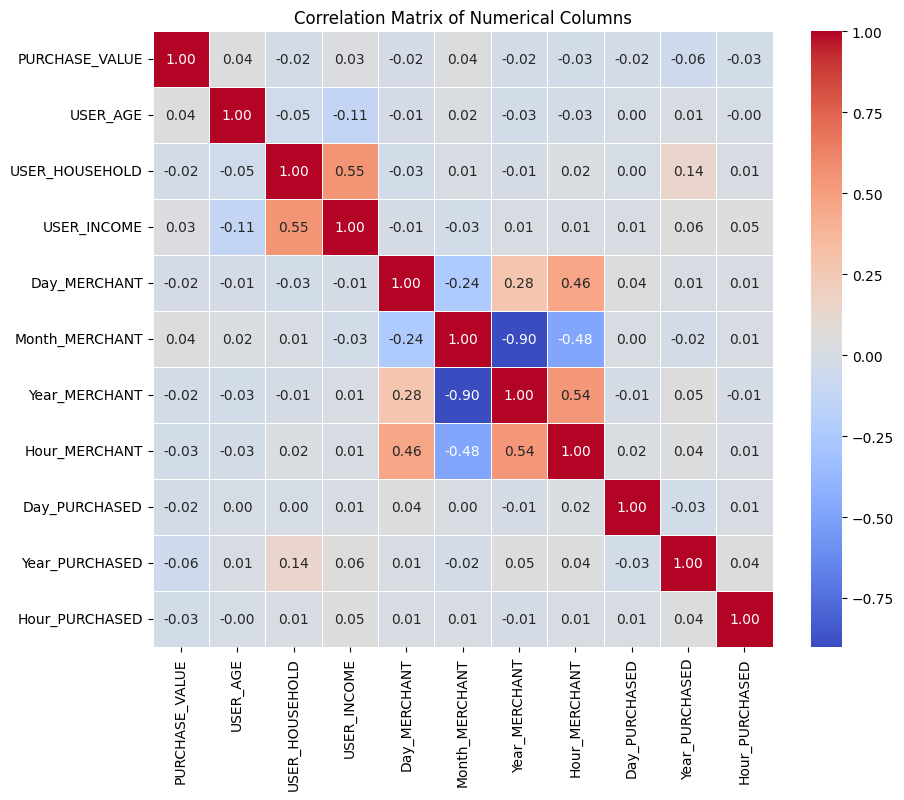

In [55]:
numerical_columns = smart_money_df.select_dtypes(include=[np.number])

correlation_matrix = numerical_columns.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix of Numerical Columns")
plt.show()

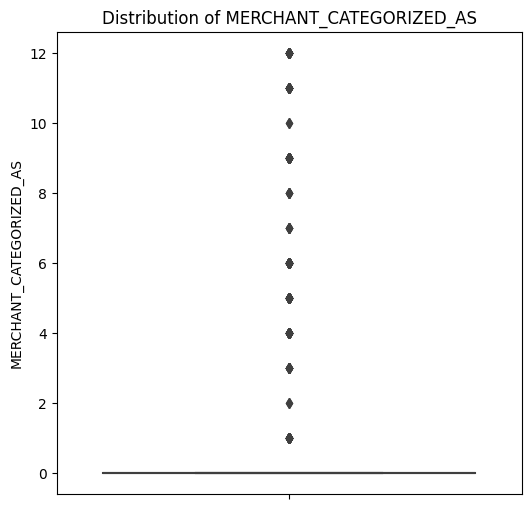

In [56]:
label_encoder = LabelEncoder()
smart_money_df['MERCHANT_CATEGORIZED_AS'] = label_encoder.fit_transform(smart_money_df['MERCHANT_CATEGORIZED_AS'])

plt.figure(figsize=(6, 6))
sns.boxplot(y=smart_money_df['MERCHANT_CATEGORIZED_AS'])
plt.title("Distribution of MERCHANT_CATEGORIZED_AS")
plt.show()

In [57]:
Q1 =smart_money_df['MERCHANT_CATEGORIZED_AS'].quantile(0.25)
Q3 = smart_money_df['MERCHANT_CATEGORIZED_AS'].quantile(0.75)
IQR = Q3 - Q1

print("Interquartile Range (IQR):", IQR)

Interquartile Range (IQR): 0.0


Text(0, 0.5, 'MERCHANT_CATEGORIZED_AS')

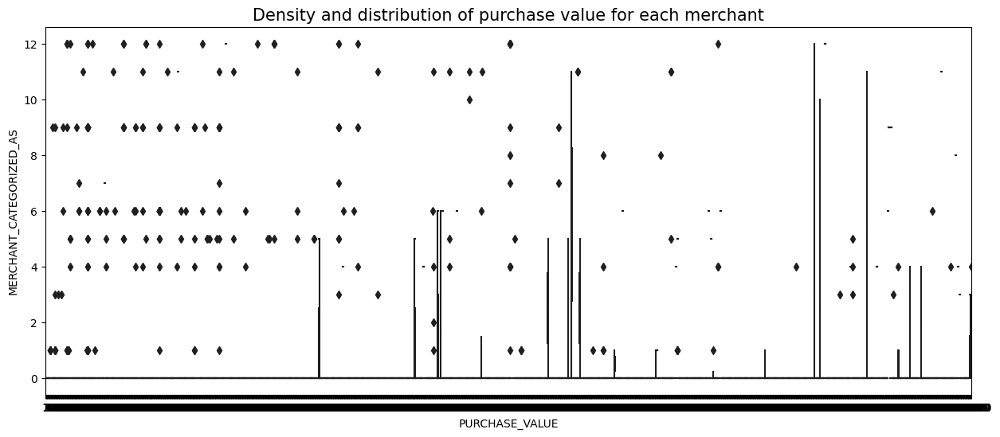

In [58]:
plt.figure(figsize=(15,6))
sns.boxplot(data=smart_money_df, x='PURCHASE_VALUE', y='MERCHANT_CATEGORIZED_AS', palette='GnBu_d')
plt.title('Density and distribution of purchase value for each merchant', fontsize=15)
plt.xlabel('PURCHASE_VALUE')
plt.ylabel("MERCHANT_CATEGORIZED_AS")

Text(0, 0.5, 'MERCHANT_CATEGORIZED_AS')

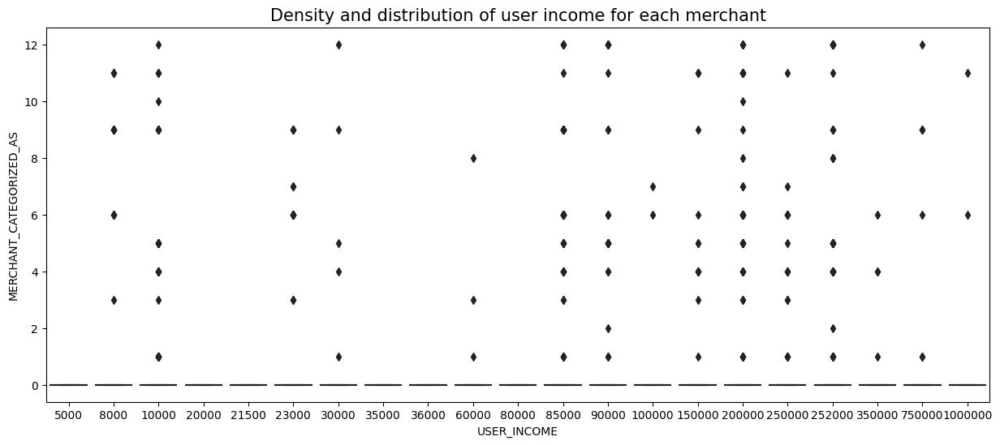

In [59]:
plt.figure(figsize=(15,6))
sns.boxplot(data=smart_money_df, x='USER_INCOME', y='MERCHANT_CATEGORIZED_AS', palette='GnBu_d')
plt.title('Density and distribution of user income for each merchant', fontsize=15)
plt.xlabel('USER_INCOME')
plt.ylabel("MERCHANT_CATEGORIZED_AS")

/var/folders/gw/0jvn6q5x6jj46f9t9ng1p8bw0000gn/T/ipykernel_5600/88077346.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(smart_money_df['MERCHANT_CATEGORIZED_AS'], kde=False)


Text(0.5, 1.0, 'Distribution of MERCHANT_CATEGORIZED_AS')

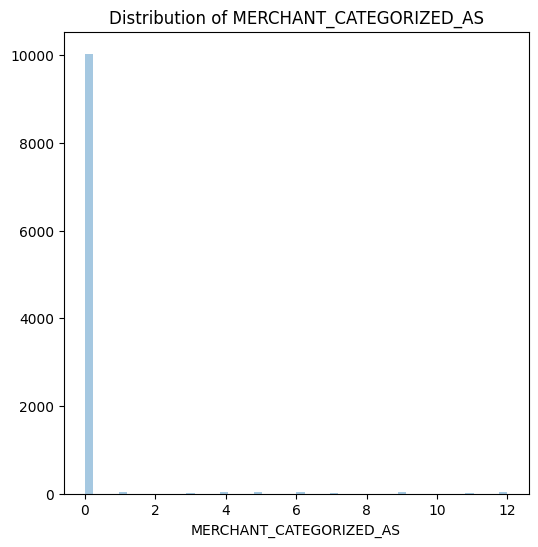

In [60]:
plt.figure(figsize=(6, 6))
sns.distplot(smart_money_df['MERCHANT_CATEGORIZED_AS'], kde=False)
plt.title('Distribution of MERCHANT_CATEGORIZED_AS')

Text(0.5, 1.0, 'Percentage in Each PURCHASE_VALUE')

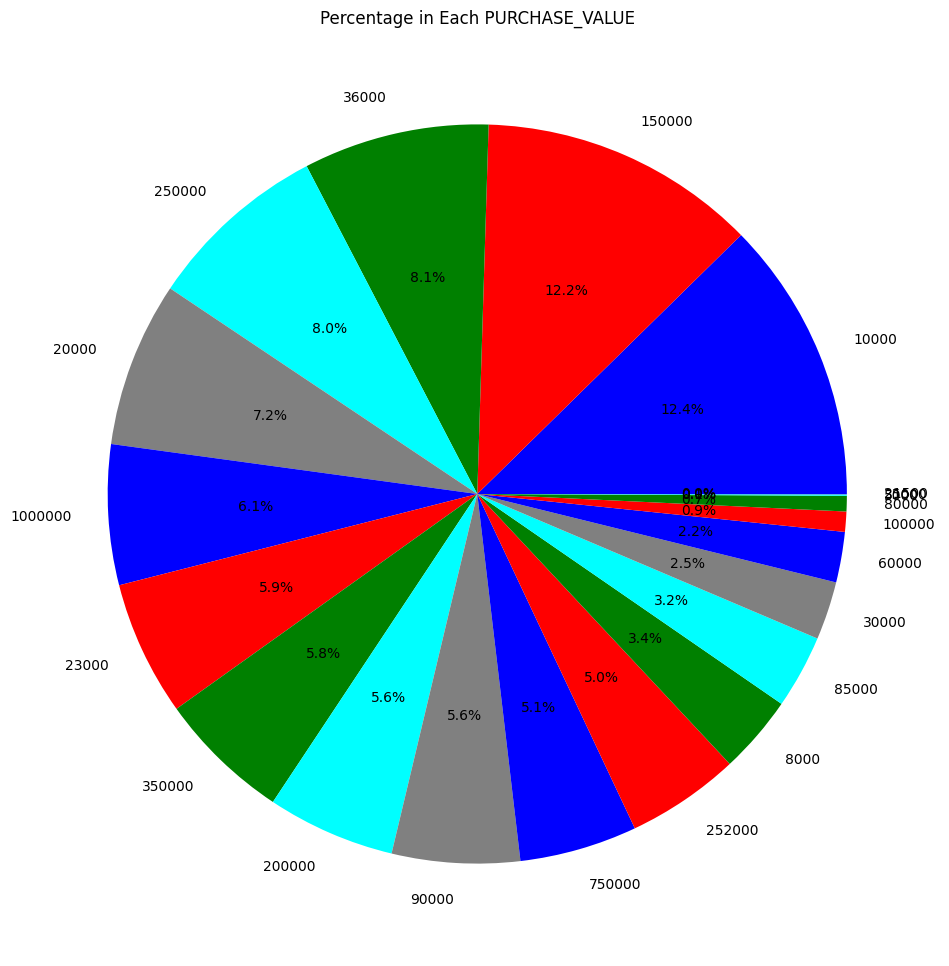

In [61]:
plt.figure(figsize=(15,12))
numbers = smart_money_df['USER_INCOME'].value_counts()
plt.pie(numbers.values, labels=numbers.index, colors=['b', 'r', 'g', 'cyan', 'gray'], autopct='%1.1f%%')
plt.title('Percentage in Each PURCHASE_VALUE')

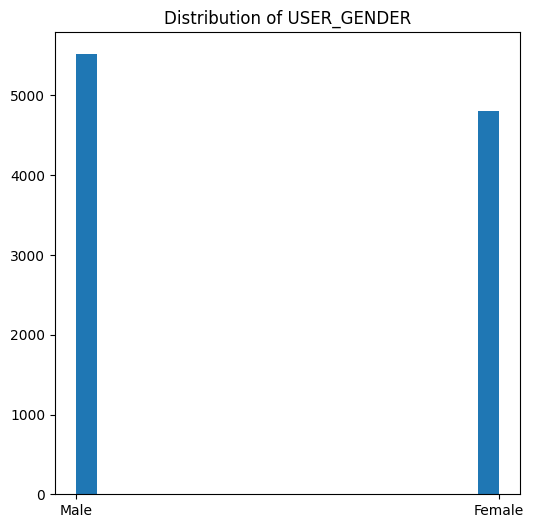

In [62]:
plt.figure(figsize=(6,6))
plt.hist(smart_money_df['USER_GENDER'], bins=20)
plt.title("Distribution of USER_GENDER")
plt.show()

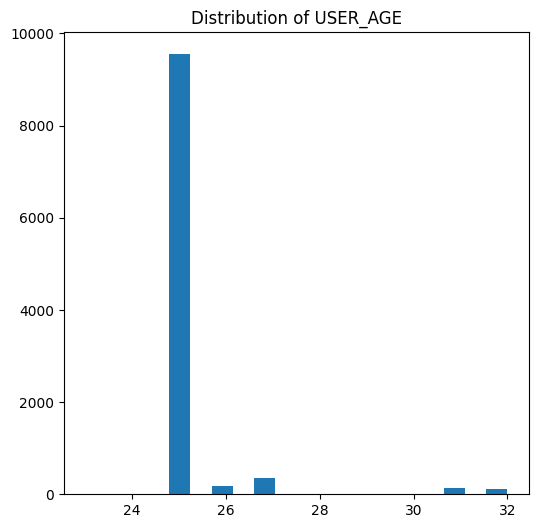

In [63]:
plt.figure(figsize=(6,6))
plt.hist(smart_money_df['USER_AGE'], bins=20)
plt.title("Distribution of USER_AGE")
plt.show()

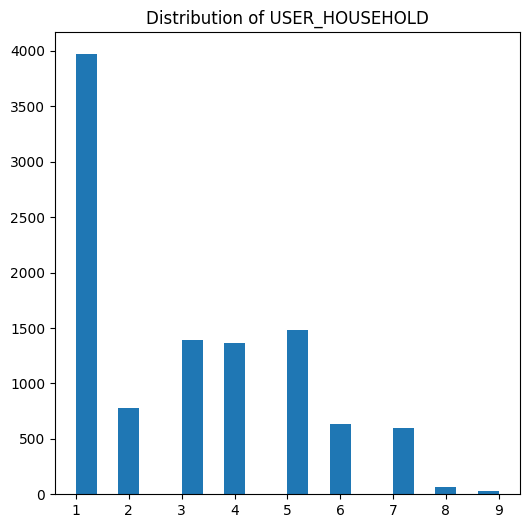

In [64]:
plt.figure(figsize=(6,6))
plt.hist(smart_money_df['USER_HOUSEHOLD'], bins=20)
plt.title("Distribution of USER_HOUSEHOLD")
plt.show()

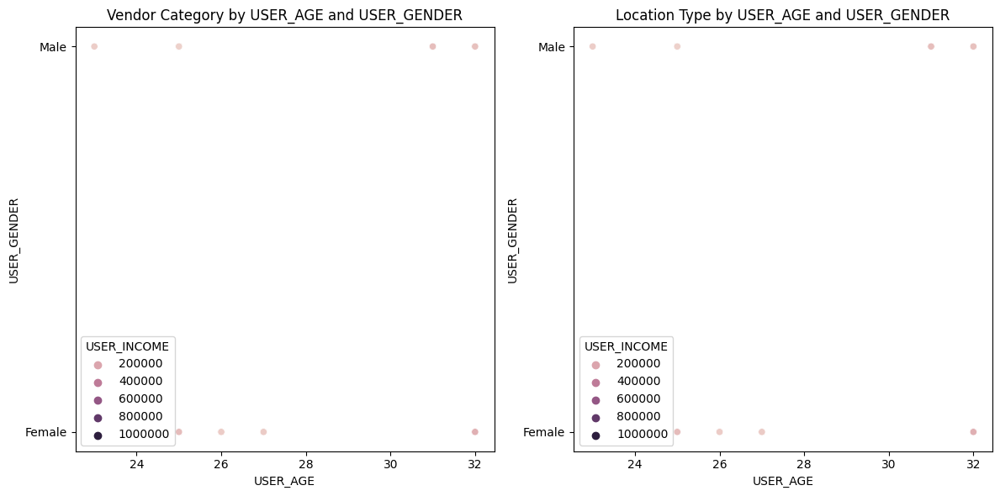

In [65]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
sns.scatterplot(x=smart_money_df['USER_AGE'], y=smart_money_df['USER_GENDER'], hue=smart_money_df['USER_INCOME'], ax=axs[0])
axs[0].set_title('Vendor Category by USER_AGE and USER_GENDER' )
axs[0].set_xlabel('USER_AGE')
axs[0].set_ylabel('USER_GENDER')
sns.scatterplot(x=smart_money_df['USER_AGE'], y=smart_money_df['USER_GENDER'], hue=smart_money_df['USER_INCOME'], ax=axs[1])
axs[1].set_title('Location Type by USER_AGE and USER_GENDER')
axs[1].set_xlabel('USER_AGE')
axs[1].set_ylabel('USER_GENDER')
plt.tight_layout()
plt.show()

In [66]:
smart_money_df['MERCHANT_CATEGORIZED_AS'] = np.log(smart_money_df['MERCHANT_CATEGORIZED_AS'])



/Users/damacm172_/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [67]:
print("Skewness:", smart_money_df['MERCHANT_CATEGORIZED_AS'].skew())
print("Kurtosis:", smart_money_df['MERCHANT_CATEGORIZED_AS'].kurt())

Skewness: nan
Kurtosis: nan


In [68]:
smart_money_df.columns

Index(['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
       'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
       'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
       'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
       'Year_PURCHASED', 'Hour_PURCHASED'],
      dtype='object')

In [106]:

smart_money_df['MERCHANT_CATEGORIZED_AS'] = np.exp(smart_money_df['MERCHANT_CATEGORIZED_AS'])

<h1> FEATURE SELECTION <h1> 

In [69]:
print(smart_money_df.isnull().sum())


MERCHANT_NAME                            0
MERCHANT_CATEGORIZED_AS                  0
PURCHASE_VALUE                           0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY    0
USER_AGE                                 0
USER_GENDER                              0
USER_HOUSEHOLD                           0
USER_INCOME                              0
Day_MERCHANT                             0
Month_MERCHANT                           0
Year_MERCHANT                            0
Hour_MERCHANT                            0
Day_PURCHASED                            0
Month_PURCHASED                          0
Year_PURCHASED                           0
Hour_PURCHASED                           0
dtype: int64


In [110]:
smart_money_df['MERCHANT_CATEGORIZED_AS'].fillna(smart_money_df['MERCHANT_CATEGORIZED_AS'].mode()[0], inplace=True)

In [70]:
print(smart_money_df.isnull().sum())

MERCHANT_NAME                            0
MERCHANT_CATEGORIZED_AS                  0
PURCHASE_VALUE                           0
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY    0
USER_AGE                                 0
USER_GENDER                              0
USER_HOUSEHOLD                           0
USER_INCOME                              0
Day_MERCHANT                             0
Month_MERCHANT                           0
Year_MERCHANT                            0
Hour_MERCHANT                            0
Day_PURCHASED                            0
Month_PURCHASED                          0
Year_PURCHASED                           0
Hour_PURCHASED                           0
dtype: int64


In [ ]:
subset_df = smart_money_df[['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
       'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
       'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
       'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
       'Year_PURCHASED', 'Hour_PURCHASED']]


# Calculate the VIF for each variable
vif = pd.DataFrame()
vif["Variable"] = subset_df.columns
vif["VIF"] = [variance_inflation_factor(subset_df.values, i) for i in range(subset_df.shape[1])]

In [72]:
# # Replace inf values with a large finite value (e.g., 1e9) and fill NaN values with 0
subset_df.replace([np.inf, -np.inf], 1e9, inplace=True)
subset_df.fillna(0, inplace=True)

# Create a list of numeric column names
numeric_columns = subset_df.select_dtypes(include=[np.number]).columns.tolist()

# Calculate the VIF for each numeric variable
vif = pd.DataFrame()
vif["Variable"] = numeric_columns
vif["VIF"] = [variance_inflation_factor(subset_df[numeric_columns].values, i) for i in range(len(numeric_columns))]

# Print the VIF values
print(vif)

                   Variable        VIF
0   MERCHANT_CATEGORIZED_AS  37.624569
1            PURCHASE_VALUE   1.014543
2                  USER_AGE   1.017275
3            USER_HOUSEHOLD   1.467997
4               USER_INCOME   1.463395
5              Day_MERCHANT   1.271632
6            Month_MERCHANT   1.381766
7             Year_MERCHANT   0.010063
8             Hour_MERCHANT   1.576960
9             Day_PURCHASED   1.003802
10           Year_PURCHASED   1.036528
11           Hour_PURCHASED   1.005858


In [73]:
smart_money_df.dtypes

MERCHANT_NAME                             object
MERCHANT_CATEGORIZED_AS                  float64
PURCHASE_VALUE                             int64
IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY       bool
USER_AGE                                 float64
USER_GENDER                               object
USER_HOUSEHOLD                             int64
USER_INCOME                                int64
Day_MERCHANT                             float64
Month_MERCHANT                           float64
Year_MERCHANT                            float64
Hour_MERCHANT                            float64
Day_PURCHASED                              int64
Month_PURCHASED                           object
Year_PURCHASED                             int64
Hour_PURCHASED                             int64
dtype: object

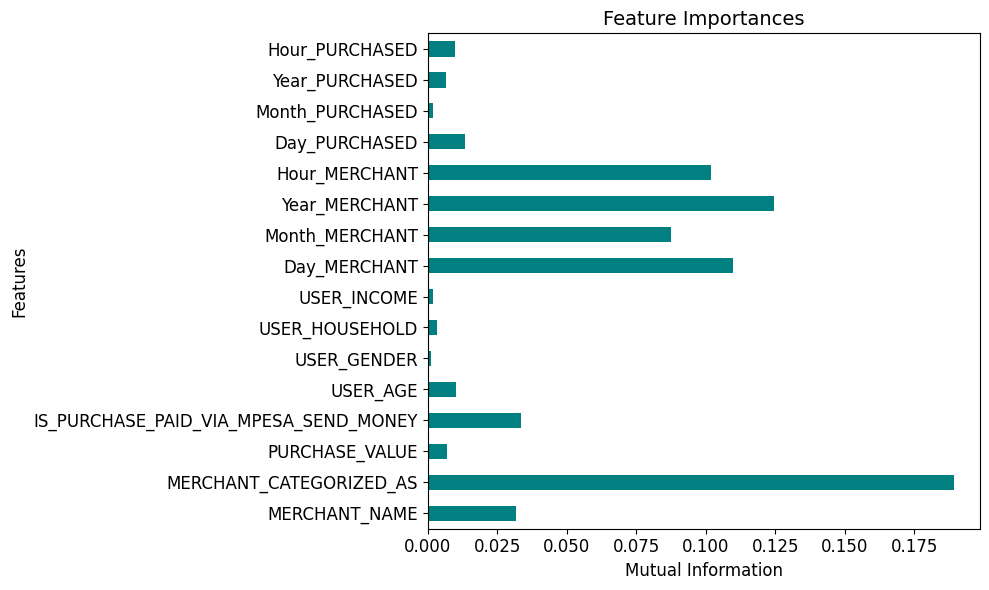

In [80]:
Y = smart_money_df['MERCHANT_CATEGORIZED_AS']
X = pd.get_dummies(smart_money_df[['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
                                   'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
                                   'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
                                   'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
                                   'Year_PURCHASED', 'Hour_PURCHASED']])
# importances = mutual_info_regression(X, Y)
# feat_importances = pd.Series(importances, index=X.columns)
# plt.figure(figsize=(10, 6))
# feat_importances.plot(kind='barh', color='teal', fontsize=12)
# plt.xlabel('Mutual Information', fontsize=12)
# plt.ylabel('Features', fontsize=12)
# plt.title('Feature Importances', fontsize=14)
# plt.subplots_adjust(left=0.3)
# plt.tight_layout()
# plt.show()


import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_regression

# Replace infinity with NaN, then fill NaN with mean or median
X = X.replace([np.inf, -np.inf], np.nan)
X.fillna(X.mean(), inplace=True)  # You can use median or other strategies as well

# Scale the data using Min-Max scaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Calculate mutual information between X and Y
importances = mutual_info_regression(X_scaled, Y)
feat_importances = pd.Series(importances, index=X.columns)

# Plot the feature importances
plt.figure(figsize=(10, 6))
feat_importances.plot(kind='barh', color='teal', fontsize=12)
plt.xlabel('Mutual Information', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title('Feature Importances', fontsize=14)
plt.subplots_adjust(left=0.3)
plt.tight_layout()
plt.show()


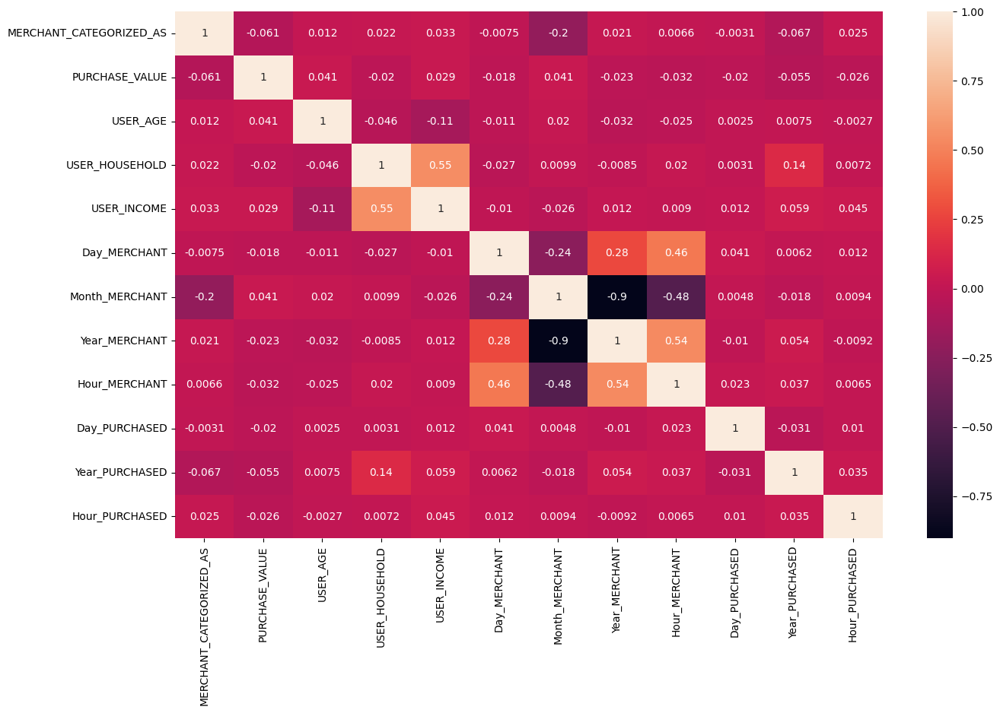

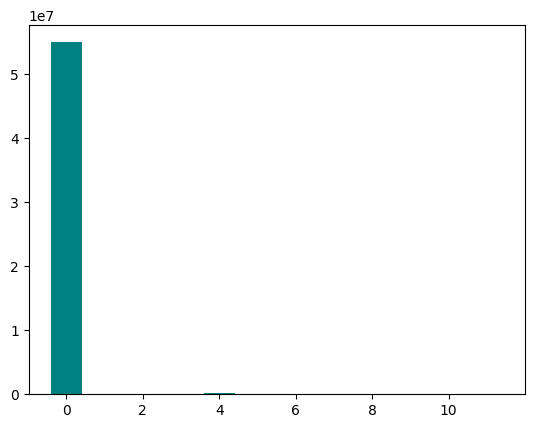

In [75]:

selected_columns = ['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
                                   'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
                                   'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
                                   'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
                                   'Year_PURCHASED', 'Hour_PURCHASED']
# Filter non-numeric columns and drop them from the subset_df DataFrame
non_numeric_columns = subset_df.select_dtypes(exclude='number').columns
subset_df = subset_df.drop(columns=non_numeric_columns)

# Now calculate correlations and mean absolute difference
cor = subset_df.corr()
plt.figure(figsize=(15, 9))
sns.heatmap(cor, annot=True)
plt.show()

# Calculate Mean Absolute Difference
mean_abs_diff = np.sum(np.abs(subset_df - np.mean(subset_df, axis=0)), axis=0) / subset_df.shape[0]
plt.bar(np.arange(subset_df.shape[1]), mean_abs_diff, color='teal')
plt.show()


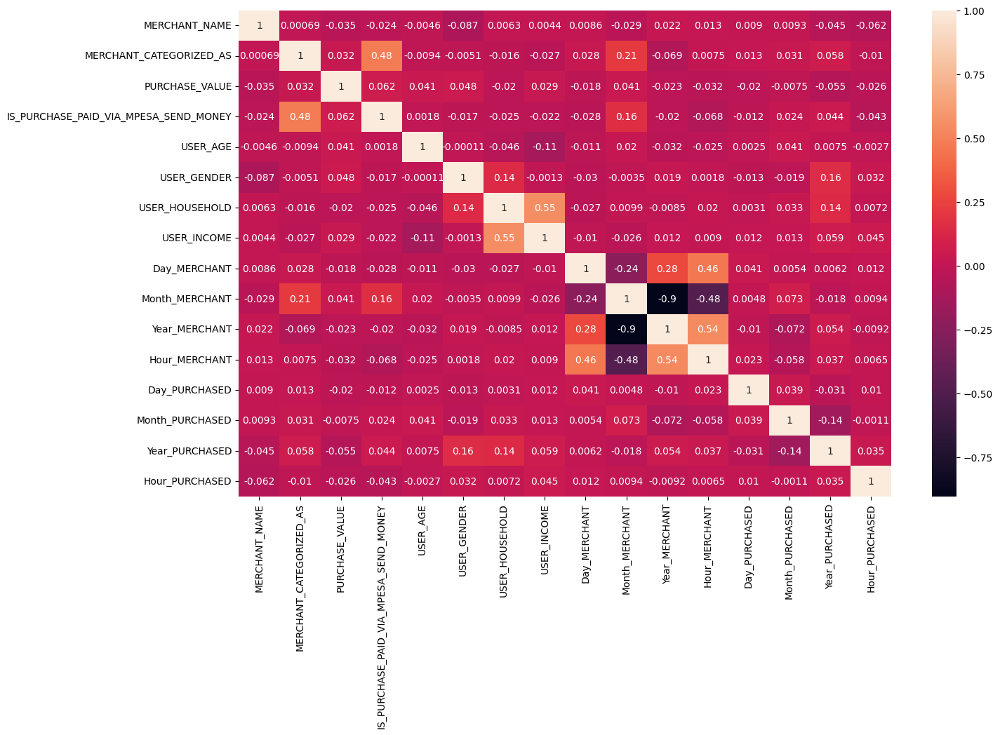

<BarContainer object of 2935 artists>

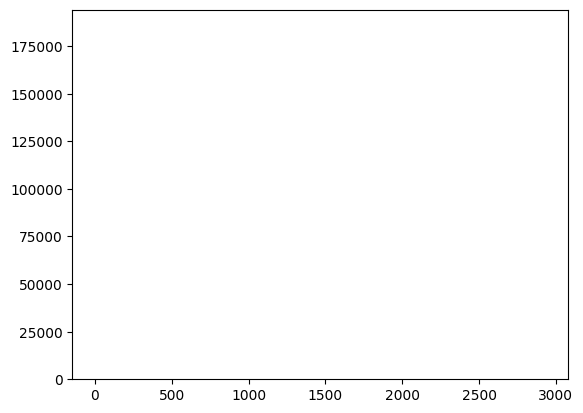

In [79]:
selected_columns = ['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
                                   'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
                                   'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
                                   'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
                                   'Year_PURCHASED', 'Hour_PURCHASED']
subset_df = smart_money_df[selected_columns]
cor = subset_df.corr()
plt.figure(figsize=(15, 9))
sns.heatmap(cor, annot=True)
plt.show()
#Mean Absolute Difference
mean_abs_diff = np.sum(np.abs(X -np.mean(X,axis = 0)), axis =0)/X.shape[0]

plt.bar(np.arange(X.shape[1]),mean_abs_diff, color = 'teal')

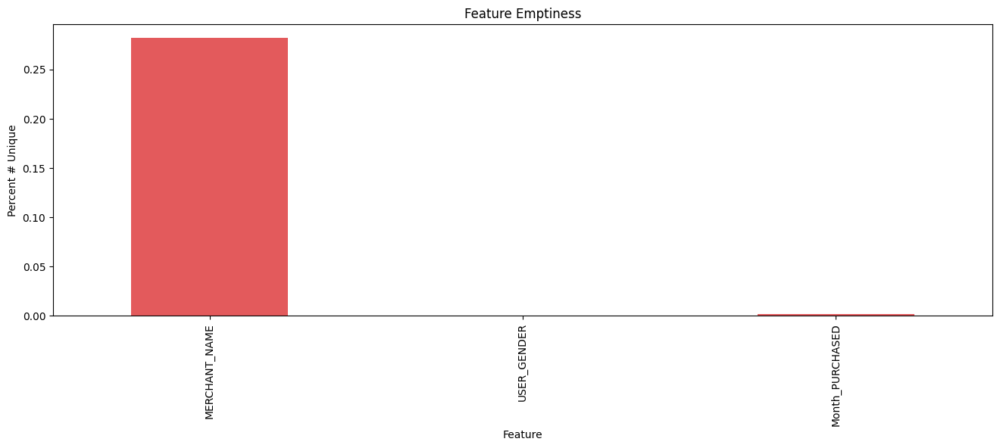

In [77]:

categories = smart_money_df.columns[smart_money_df.dtypes == 'object']
percentage_unique = smart_money_df[categories].nunique() / smart_money_df.shape[0]

ax = percentage_unique.plot(kind = 'bar', color='#E35A5C', figsize = (16, 5))
ax.set_xlabel('Feature')
ax.set_ylabel('Percent # Unique')
ax.set_title('Feature Emptiness')
plt.show()

In [78]:
# Categorical Columns:['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'USER_GENDER', 'Month_PURCHASED']

encodingRest = LabelEncoder()


smart_money_df["MERCHANT_NAME"] = encodingRest.fit_transform(smart_money_df["MERCHANT_NAME"])

smart_money_df["MERCHANT_CATEGORIZED_AS"] = encodingRest.fit_transform(smart_money_df["MERCHANT_CATEGORIZED_AS"])

smart_money_df["USER_GENDER"] = encodingRest.fit_transform(smart_money_df["USER_GENDER"])

smart_money_df["Month_PURCHASED"] = encodingRest.fit_transform(smart_money_df["Month_PURCHASED"])

In [ ]:
features = ['MERCHANT_NAME', 'MERCHANT_CATEGORIZED_AS', 'PURCHASE_VALUE',
            'IS_PURCHASE_PAID_VIA_MPESA_SEND_MONEY', 'USER_AGE', 'USER_GENDER',
            'USER_HOUSEHOLD', 'USER_INCOME', 'Day_MERCHANT', 'Month_MERCHANT',
            'Year_MERCHANT', 'Hour_MERCHANT', 'Day_PURCHASED', 'Month_PURCHASED',
             'Year_PURCHASED', 'Hour_PURCHASED']

target =  'MERCHANT_CATEGORIZED_AS'
X = smart_money_df[features]
Y =smart_money_df[target]

testx = dftest

scale = StandardScaler()
scaledX = scale.fit_transform(X)

scaletest = StandardScaler()
scaledXtest= scaletest.fit_transform(testx)

print(scaledX)

In [ ]:
#Split the data into a training set of 25% and a test set of 75%
# X_train, X_test, y_train, y_test = train_test_split(scaledX,Y, test_size=0.2)

In [ ]:
dt_clf = DecisionTreeClassifier(random_state=0)
rf_clf = RandomForestClassifier(n_estimators=100, random_state=0)
lr_clf = LogisticRegression()
svc_clf = SVC(probability=True)  # Set probability=True for using with AdaBoost
knn_clf = KNeighborsClassifier()
adaboost_clf = AdaBoostClassifier()

list_clf = [dt_clf]

In [ ]:
# all_models = []
# for clf in list_clf:
#     clf.fit(X_train, y_train)
#     test_y_pred = clf.predict(X_test)
#     train_y_pred = clf.predict(X_train)

#     train_accuracy = accuracy_score(y_train, train_y_pred)
#     test_accuracy = accuracy_score(y_test, test_y_pred)

#     train_precision = precision_score(y_train, train_y_pred, average='weighted')
#     test_precision = precision_score(y_test, test_y_pred, average='weighted')

#     train_recall = recall_score(y_train, train_y_pred, average='weighted')
#     test_recall = recall_score(y_test, test_y_pred, average='weighted')

#     train_f1_score = f1_score(y_train, train_y_pred, average='weighted')
#     test_f1_score = f1_score(y_test, test_y_pred, average='weighted')

#     classification_metrics = ['Accuracy-train', 'Accuracy-test', 'Precision-train', 'Precision-test',
#                               'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test']

#     model_metrics = [train_accuracy, test_accuracy, train_precision, test_precision,
#                      train_recall, test_recall, train_f1_score, test_f1_score]

#     all_models.append(model_metrics)
    
# # Retrieve the metrics for each classification model
# dt_clf_metrics = all_models[0]
# rf_clf_metrics = all_models[1]
# lr_clf_metrics = all_models[2]
# svc_clf_metrics = all_models[3]
# knn_clf_metrics = all_models[4]
# adaboost_clf_metrics = all_models[5]

In [ ]:
# destree = pd.DataFrame([dt_clf_metrics], index=['R2-train', 'R2-test', 'Precision-train', 'Precision-test', 'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test'], columns=['Decision Tree'])

# ranforest = pd.DataFrame([rf_clf_metrics], index=['R2-train', 'R2-test', 'Precision-train', 'Precision-test', 'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test'], columns=['Random forest'])

# lassoc = pd.DataFrame([lr_clf_metrics], index=['R2-train', 'R2-test', 'Precision-train', 'Precision-test', 'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test'], columns=['Logistic Regression'])

# Ridgereg = pd.DataFrame([svc_clf_metrics], index=['R2-train', 'R2-test', 'Precision-train', 'Precision-test', 'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test'], columns=['SVM (SVC)'])

# linearR = pd.DataFrame([knn_clf_metrics], index=['R2-train', 'R2-test', 'Precision-train', 'Precision-test', 'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test'], columns=['KNN'])

# Adaboost = pd.DataFrame([adaboost_clf_metrics], index=['R2-train', 'R2-test', 'Precision-train', 'Precision-test', 'Recall-train', 'Recall-test', 'F1-score-train', 'F1-score-test'], columns=['AdaBoost'])


In [ ]:
# dfs = [destree, ranforest, lassoc, Ridgereg, linearR, Adaboost]

# # Merge the DataFrames
# merged_df = pd.concat(dfs, axis=1)

# # Display the merged DataFrame
# print(merged_df)